In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Load the data
airbnb_df = pd.read_csv("../data/raw/airbnb_listings.csv")
airbnb_df.head(5)

/var/folders/td/ww89yxjs78g7pbjshk80ysbr0000gn/T/ipykernel_76801/2274393879.py:8: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  airbnb_df = pd.read_csv("../data/raw/airbnb_listings.csv")


,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN


In [3]:
airbnb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [4]:
airbnb_df.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules', 'license'],
      dtype='object')

In [5]:
airbnb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [6]:
airbnb_df.isna().sum()

id                                     0
NAME                                 250
host id                                0
host_identity_verified               289
host name                            406
neighbourhood group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country code                         131
instant_bookable                     105
cancellation_policy                   76
room type                              0
Construction year                    214
price                                247
service fee                          273
minimum nights                       409
number of reviews                    183
last review                        15893
reviews per month                  15879
review rate number                   326
calculated host listings count       319
availability 365                     448
house_rules     

In [7]:
airbnb_df.shape

(102599, 26)

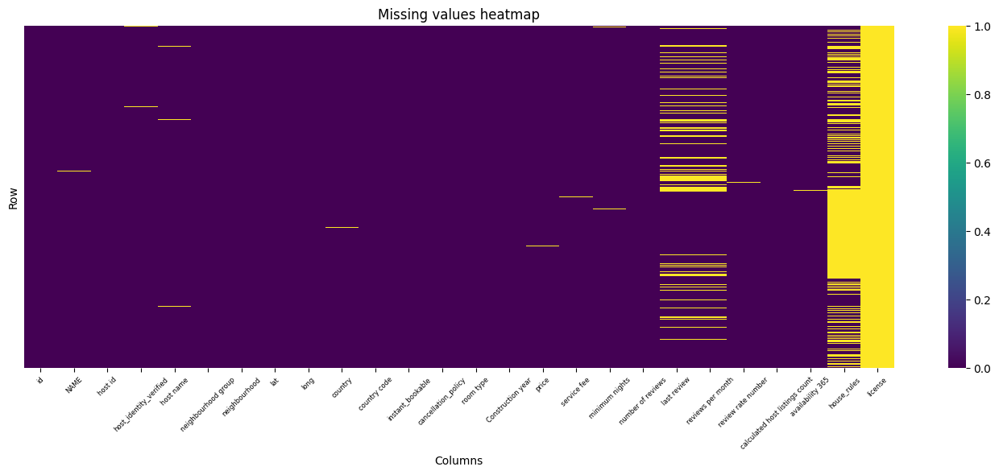

In [8]:
plt.figure(figsize = (14, 6))
sns.heatmap(
    airbnb_df.isna(),
    cbar = True,
    yticklabels = False,
    cmap = "viridis"
)
plt.title("Missing values heatmap")
plt.xlabel("Columns")
plt.ylabel("Row")
plt.xticks(rotation = 45, fontsize = 6)
plt.tight_layout()
plt.show()

In [9]:
airbnb_df.describe()

,id,host id,lat,long,Construction year,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
count,1.025990e+05,1.025990e+05,102591.000000,102591.000000,102385.000000,102190.000000,102416.000000,86720.000000,102273.000000,102280.000000,102151.000000
mean,2.914623e+07,4.925411e+10,40.728094,-73.949644,2012.487464,8.135845,27.483743,1.374022,3.279106,7.936605,141.133254
std,1.625751e+07,2.853900e+10,0.055857,0.049521,5.765556,30.553781,49.508954,1.746621,1.284657,32.218780,135.435024
min,1.001254e+06,1.236005e+08,40.499790,-74.249840,2003.000000,-1223.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,1.508581e+07,2.458333e+10,40.688740,-73.982580,2007.000000,2.000000,1.000000,0.220000,2.000000,1.000000,3.000000
50%,2.913660e+07,4.911774e+10,40.722290,-73.954440,2012.000000,3.000000,7.000000,0.740000,3.000000,1.000000,96.000000
75%,4.320120e+07,7.399650e+10,40.762760,-73.932350,2017.000000,5.000000,30.000000,2.000000,4.000000,2.000000,269.000000
max,5.736742e+07,9.876313e+10,40.916970,-73.705220,2022.000000,5645.000000,1024.000000,90.000000,5.000000,332.000000,3677.000000


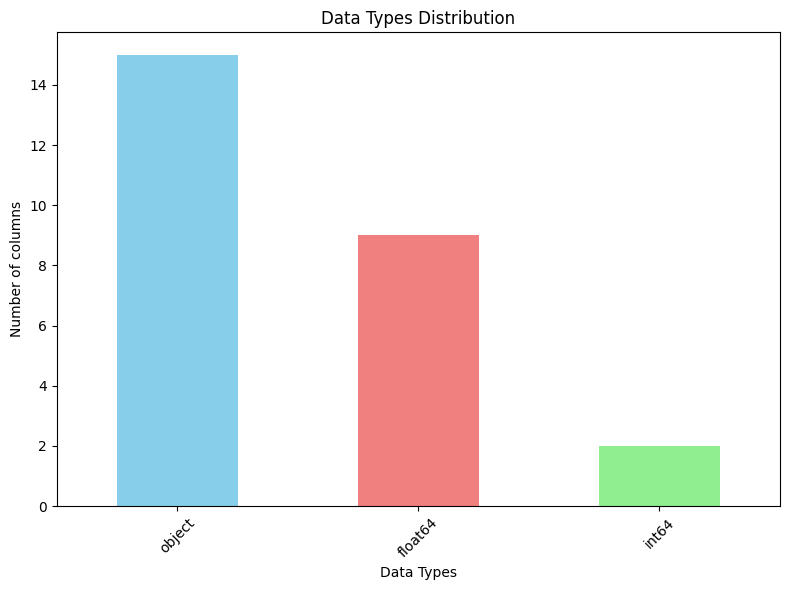

In [9]:
dtype_counts = airbnb_df.dtypes.value_counts()

plt.figure(figsize = (8, 6))
dtype_counts.plot(kind = "bar", color=['skyblue', 'lightcoral', 'lightgreen'])
plt.title("Data Types Distribution")
plt.xlabel("Data Types")
plt.ylabel("Number of columns")
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

In [11]:
# Lets check if id column is unique or not
airbnb_df["id"].nunique()

102058

In [12]:
# find the duplicate ids or null ids
ids = (
    airbnb_df.groupby("id")
    .size()
    .reset_index(name = "count")
)
issue_ids = ids[(ids["count"] > 1) | (ids["id"].isna())]
issue_ids

,id,count
9098,6026161,2
9099,6026714,2
9100,6027266,2
9101,6027818,2
9102,6028371,2
...,...,...
62655,35605693,2
62656,35606245,2
62657,35606797,2
62658,35607349,2


In [13]:
# lets check the duplicate ids data
airbnb_df[airbnb_df["id"] == 6028371]

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
9102,6028371,*JAMES* Amazing Spacious 2 Bedroom- Bright!,37678424985,verified,Juliana,Manhattan,Upper East Side,40.76035,-73.96133,United States,...,$161,30.0,8.0,6/11/2019,0.27,4.0,34.0,411.0,Be courteous and respectful to people in the h...,NaN
102478,6028371,*JAMES* Amazing Spacious 2 Bedroom- Bright!,37678424985,verified,Juliana,Manhattan,Upper East Side,40.76035,-73.96133,United States,...,$161,30.0,8.0,6/11/2019,0.27,4.0,34.0,411.0,Be courteous and respectful to people in the h...,NaN


In [14]:
# lets explore name columns
airbnb_df["NAME"].isna().sum()

np.int64(250)

In [15]:
airbnb_df["NAME"].value_counts()[:20]

NAME
Home away from home                                   33
Hillside Hotel                                        30
Water View King Bed Hotel Room                        30
New york Multi-unit building                          27
Brooklyn Apartment                                    27
Private Room                                          23
#NAME?                                                20
Cozy Brooklyn Apartment                               20
Private room in Brooklyn                              19
Cozy home away from home                              18
Beautiful King Bed Hotel Room                         18
IN MINT CONDITION-STUDIOS EAST 44TH/UNITED NATIONS    18
Beautiful 2 Double Bed Hotel Room                     18
Private room                                          17
Hotel Room King Bed Chelsea                           16
Private room in Williamsburg                          16
Harlem Gem                                            16
20-25 minutes to downtown 

In [16]:
airbnb_df["NAME"].nunique()

61281

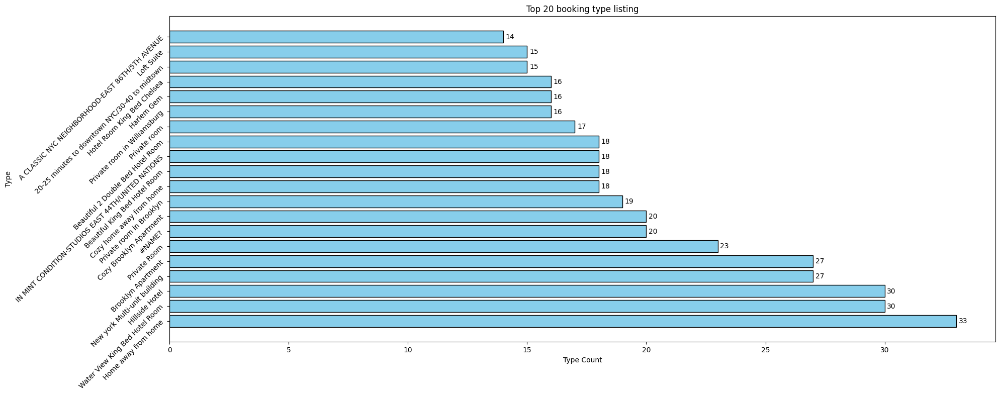

In [17]:
# Top 20 common name listing
top_20_listing_type = airbnb_df["NAME"].value_counts().sort_values(ascending = False).head(20)

plt.figure(figsize=(20, 8))
plt.barh(y = top_20_listing_type.index, width =top_20_listing_type.values, color = "skyblue", edgecolor = "black")
for index, value in enumerate(top_20_listing_type.values):
    plt.text(value + 0.1, index, str(value), va = "center")
plt.title("Top 20 booking type listing")
plt.xlabel("Type Count")
plt.ylabel("Type")
plt.yticks(rotation = 45)
plt.tight_layout()
plt.show()

In [18]:
# Exploring host_identity_verified column data

In [19]:
airbnb_df["host_identity_verified"].nunique()

2

In [20]:
airbnb_df["host_identity_verified"].unique()

array(['unconfirmed', 'verified', nan], dtype=object)

In [21]:
host_verification_counts = airbnb_df["host_identity_verified"].value_counts()
host_verification_counts

host_identity_verified
unconfirmed    51200
verified       51110
Name: count, dtype: int64

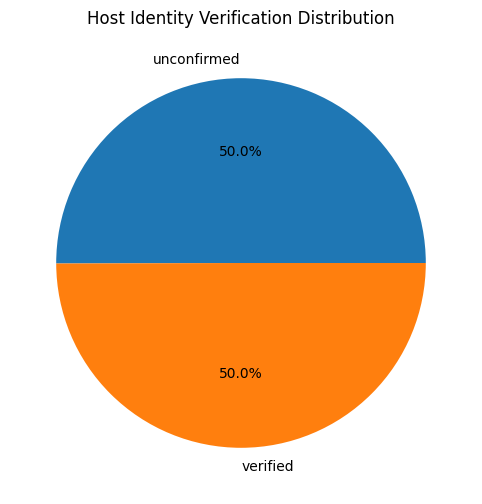

In [22]:
plt.figure(figsize = (8, 6))
plt.pie(host_verification_counts.values, labels = host_verification_counts.index, autopct = "%1.1f%%")
plt.title("Host Identity Verification Distribution")
plt.show()

In [23]:
airbnb_df[airbnb_df["host_identity_verified"].isna()][:5]

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
6,1004650,BlissArtsSpace!,61300605564,NaN,Alberta,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,United States,...,$14,45.0,49.0,10/5/2017,0.40,5.0,1.0,224.0,Please no shoes in the house so bring slippers...,NaN
19,1011830,Hip Historic Brownstone Apartment with Backyard,72145018858,NaN,Martin,Brooklyn,Crown Heights,40.67592,-73.94694,United States,...,NaN,3.0,53.0,6/22/2019,4.44,5.0,1.0,345.0,LAUNDRY - Laundry can be done by the visitor b...,NaN
23,1014039,CBG Helps Haiti Room#2.5,87668933180,NaN,William,Brooklyn,Park Slope,40.67989,-73.97798,United States,...,$210,1.0,39.0,1/1/2019,0.37,3.0,6.0,9.0,NaN,NaN
25,1015144,"MAISON DES SIRENES1,bohemian apartment",48387947293,NaN,Miranda,Brooklyn,Bedford-Stuyvesant,40.68371,-73.94028,United States,...,$235,2.0,88.0,6/19/2019,0.73,4.0,2.0,372.0,NaN,NaN


In [24]:
# Explore host name column

In [25]:
airbnb_df["host name"].nunique()

13190

In [26]:
airbnb_df[airbnb_df["host name"].isna()][:5]

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
12,1007964,Central Manhattan/near Broadway,88136055909,verified,NaN,Manhattan,Hell's Kitchen,40.76076,-73.98867,United States,...,$143,2.0,188.0,6/23/2019,1.50,4.0,1.0,258.0,- One of the bedroom closets is not accessible...,NaN
99,1056014,NaN,31493374340,verified,NaN,Manhattan,Chelsea,40.74008,-74.00271,United States,...,$106,NaN,30.0,5/1/2019,0.27,NaN,2.0,64.0,NaN,NaN
100,1056566,NaN,47504416702,unconfirmed,NaN,Brooklyn,Bedford-Stuyvesant,40.68413,-73.92357,United States,...,$148,NaN,139.0,10/28/2018,1.23,NaN,2.0,184.0,Terms of the Agreement: 1. The Landlord has t...,NaN
134,1075344,Unique & Charming small 1br Apt. LES,77518406270,unconfirmed,NaN,Manhattan,Lower East Side,40.71341,-73.98856,United States,...,$220,3.0,32.0,6/14/2019,0.29,5.0,1.0,62.0,NaN,NaN
135,1075897,Most Central Location!,53246473793,unconfirmed,NaN,Manhattan,Hell's Kitchen,40.76754,-73.98399,United States,...,$51,2.0,50.0,5/26/2019,0.45,2.0,3.0,366.0,Please be respectful of my things! I have a lo...,NaN


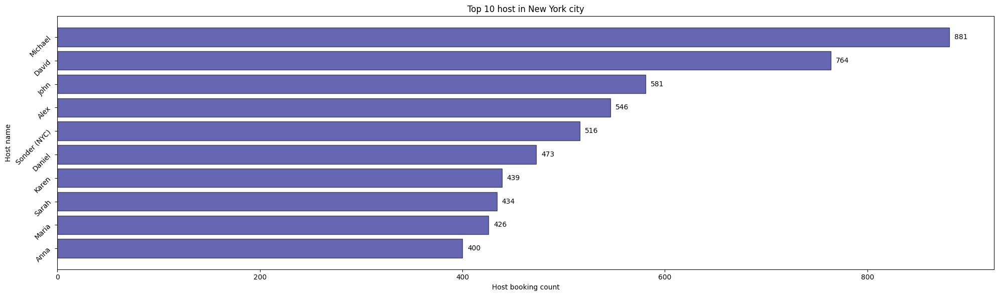

In [27]:
top_10_hosts = airbnb_df["host name"].value_counts().sort_values(ascending = False).head(10)
top_10_hosts = top_10_hosts[::-1]

plt.figure(figsize=(20, 6))
plt.barh(y = top_10_hosts.index, width = top_10_hosts.values, color = "navy", alpha = 0.6, edgecolor = "black")
for index, value in enumerate(top_10_hosts.values):
    plt.text(value + 5, index, str(value), va = "center")
plt.title("Top 10 host in New York city")
plt.xlabel("Host booking count")
plt.ylabel("Host name")
plt.yticks(rotation = 45)
plt.tight_layout()
plt.show()

In [28]:
# Explore neighbourhood group column

In [29]:
airbnb_df["neighbourhood group"].nunique()

7

In [30]:
airbnb_df["neighbourhood group"].unique()

array(['Brooklyn', 'Manhattan', 'brookln', 'manhatan', 'Queens', nan,
       'Staten Island', 'Bronx'], dtype=object)

In [31]:
airbnb_df["neighbourhood group"].value_counts()

neighbourhood group
Manhattan        43792
Brooklyn         41842
Queens           13267
Bronx             2712
Staten Island      955
brookln              1
manhatan             1
Name: count, dtype: int64

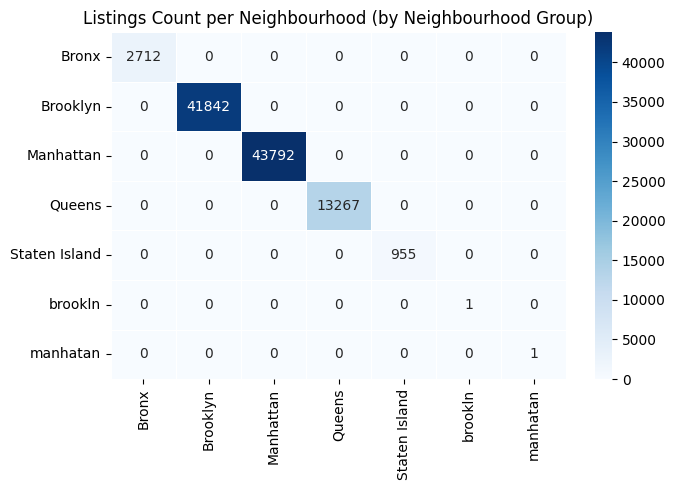

In [32]:
neighbourhood_cross_tab = pd.crosstab(
    airbnb_df["neighbourhood group"],
    airbnb_df["neighbourhood group"]
)

plt.figure(figsize = (7, 5))
sns.heatmap(neighbourhood_cross_tab, annot=True, fmt="d", cmap="Blues", linewidths=0.5)
plt.title("Listings Count per Neighbourhood (by Neighbourhood Group)")
plt.xlabel('')
plt.ylabel('')
plt.tight_layout()
plt.show()

In [33]:
airbnb_df[airbnb_df["neighbourhood group"].isna()].head(5)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
74,1042206,"HARLEM, NEW YORK WELCOMES YOU!!",98195975718,NaN,Violet,NaN,Washington Heights,40.83139,-73.94095,United States,...,$114,2.0,49.0,6/18/2019,1.60,2.0,2.0,NaN,The usual courtesies apply: - No smoking - No ...,NaN
75,1042759,BLUE TRIM GUEST HOUSE,4726877402,unconfirmed,Audrey,NaN,Clinton Hill,40.68346,-73.96374,United States,...,$80,2.0,105.0,6/26/2019,0.92,1.0,1.0,NaN,Shoes off please Cat can go in or out as he de...,NaN
76,1043311,Charming East Village One Bedroom Flat,74322993447,verified,Violet,NaN,East Village,40.72828,-73.98801,United States,...,$124,5.0,21.0,1/2/2019,0.20,4.0,1.0,NaN,no smoking quiet,NaN
77,1043863,Manhattan Room,11468499446,verified,Sofia,NaN,Upper East Side,40.76865,-73.95058,United States,...,$23,1.0,142.0,7/6/2019,1.50,4.0,1.0,NaN,I'm a semi kosher vegetarian which means that ...,NaN
78,1044415,Little King of Queens,68599531533,unconfirmed,Melanie,NaN,Woodside,40.75038,-73.90334,United States,...,$11,30.0,25.0,NaN,0.22,2.0,1.0,NaN,No Street Shoes allowed in House. No cooking K...,NaN


In [34]:
# Lets compare the neighbourhood group nan values with neighbourhood and see if we can assign a group based on similar name

In [35]:
nullgroup_unique_neighbourhood = airbnb_df[airbnb_df["neighbourhood group"].isna()]["neighbourhood"].unique()
nullgroup_unique_neighbourhood

array(['Washington Heights', 'Clinton Hill', 'East Village',
       'Upper East Side', 'Woodside', 'Williamsburg', 'Bushwick',
       'Prospect Heights', 'Chelsea', 'East Harlem', 'Eastchester',
       'Harlem', 'Chinatown', 'Queens Village', 'Bedford-Stuyvesant',
       'Upper West Side'], dtype=object)

In [36]:
unique_neighbourhood = airbnb_df["neighbourhood"].unique()
unique_neighbourhood

array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

In [37]:
is_all_present = all(name in unique_neighbourhood for name in nullgroup_unique_neighbourhood)
is_all_present

True

In [38]:
neighbour_combination = (
    airbnb_df.groupby(["neighbourhood group", "neighbourhood"])
    .size()
    .reset_index(name = "count")
    .sort_values("count", ascending = False)
)
neighbour_combination.head(10)

,neighbourhood group,neighbourhood,count
50,Brooklyn,Bedford-Stuyvesant,7936
94,Brooklyn,Williamsburg,7770
106,Manhattan,Harlem,5463
58,Brooklyn,Bushwick,4979
107,Manhattan,Hell's Kitchen,3965
125,Manhattan,Upper West Side,3859
124,Manhattan,Upper East Side,3679
101,Manhattan,East Village,3489
113,Manhattan,Midtown,3390
65,Brooklyn,Crown Heights,3262


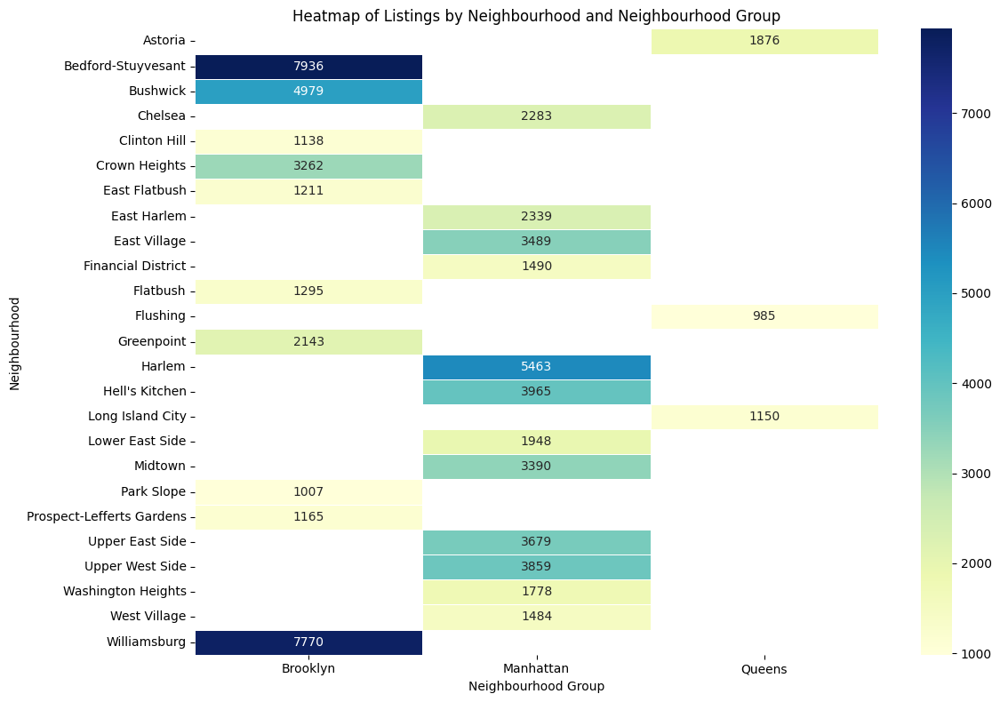

In [39]:
pivot_neigh_comb = neighbour_combination.sort_values("count", ascending = False).head(25).pivot(
    index="neighbourhood",
    columns="neighbourhood group",
    values = "count"
)

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_neigh_comb, annot=True, fmt=".0f", cmap="YlGnBu", linewidths=0.5)
plt.title("Heatmap of Listings by Neighbourhood and Neighbourhood Group")
plt.xlabel("Neighbourhood Group")
plt.ylabel("Neighbourhood")
plt.tight_layout()
plt.show()

In [40]:
neighbour_combination.shape

(226, 3)

In [54]:
coordinates = (
    airbnb_df.dropna(subset = ["lat", "long"])
    .groupby(["lat", "long"])["id"]
    .size()
    .reset_index(name = "booking_count")
)

fig = px.scatter_mapbox(
    coordinates,
    lat="lat",
    lon="long",
    size="booking_count",
    color="lat",
    zoom=10,
    height=800,
    title="Airbnb Bookings by Location",
)

fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0, "t":50, "l":0, "b":0})

fig.show()

/var/folders/td/ww89yxjs78g7pbjshk80ysbr0000gn/T/ipykernel_15253/2157969573.py:8: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [41]:
airbnb_df[airbnb_df["lat"].isna()].head(2)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
779,1431578,"Large, furnished room in a 2 bedroom!",20368956893,unconfirmed,Gibson,Brooklyn,Crown Heights,NaN,NaN,United States,...,$108,1.0,1.0,3/18/2017,0.04,2.0,1.0,41.0,- Weekly and monthly prices are much lower - P...,NaN
785,1434892,Authentic NY Charming Artist Loft,66486085219,unconfirmed,Bailey,Brooklyn,Greenpoint,NaN,NaN,United States,...,$212,5.0,14.0,6/19/2019,0.16,5.0,1.0,226.0,We live and let live - hoping that you'd be re...,NaN


In [42]:
airbnb_df[airbnb_df["long"].isna()].head(2)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
779,1431578,"Large, furnished room in a 2 bedroom!",20368956893,unconfirmed,Gibson,Brooklyn,Crown Heights,NaN,NaN,United States,...,$108,1.0,1.0,3/18/2017,0.04,2.0,1.0,41.0,- Weekly and monthly prices are much lower - P...,NaN
785,1434892,Authentic NY Charming Artist Loft,66486085219,unconfirmed,Bailey,Brooklyn,Greenpoint,NaN,NaN,United States,...,$212,5.0,14.0,6/19/2019,0.16,5.0,1.0,226.0,We live and let live - hoping that you'd be re...,NaN


In [43]:
airbnb_df["country"].unique()

array(['United States', nan], dtype=object)

In [44]:
airbnb_df[airbnb_df["country"].isna()].head(2)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
156,1087495,"Sunny, clean 1 bdrm in W. Village",75987317883,verified,James,Manhattan,West Village,40.73226,-74.00401,NaN,...,$148,45.0,134.0,NaN,1.24,3.0,1.0,426.0,NaN,NaN
157,1088047,Great location in Williamsburg,51756716507,unconfirmed,Roman,Brooklyn,Williamsburg,40.71363,-73.96398,NaN,...,$203,6.0,27.0,NaN,0.25,3.0,1.0,396.0,NaN,NaN


In [37]:
airbnb_df["country code"].unique()

array(['US', nan], dtype=object)

In [38]:
airbnb_df[airbnb_df["country code"].isna()].head(2)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
16,1010173,Only 2 stops to Manhattan studio,62566345680,unconfirmed,Heather,Brooklyn,Williamsburg,40.70837,-73.95352,United States,...,NaN,2.0,148.0,6/29/2019,1.20,3.0,1.0,197.0,"Absolutely no smoking in the building, handlin...",NaN
17,1010725,Perfect for Your Parents + Garden,80380130347,verified,Ryan,Brooklyn,Fort Greene,40.69169,-73.97185,United States,...,NaN,2.0,198.0,6/28/2019,1.72,5.0,1.0,96.0,"- Please be mindful of the neighbors, quiet ti...",NaN


In [39]:
airbnb_df["instant_bookable"].unique()

array([False, True, nan], dtype=object)

In [40]:
airbnb_df[airbnb_df["instant_bookable"].isna()].head(2)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
16,1010173,Only 2 stops to Manhattan studio,62566345680,unconfirmed,Heather,Brooklyn,Williamsburg,40.70837,-73.95352,United States,...,NaN,2.0,148.0,6/29/2019,1.20,3.0,1.0,197.0,"Absolutely no smoking in the building, handlin...",NaN
17,1010725,Perfect for Your Parents + Garden,80380130347,verified,Ryan,Brooklyn,Fort Greene,40.69169,-73.97185,United States,...,NaN,2.0,198.0,6/28/2019,1.72,5.0,1.0,96.0,"- Please be mindful of the neighbors, quiet ti...",NaN


In [41]:
airbnb_df["instant_bookable"].isna().sum()

np.int64(105)

In [19]:
airbnb_df["instant_bookable"] = airbnb_df["instant_bookable"].replace({ True: "Yes", False: "No"})
instant_bookable_distribution = airbnb_df["instant_bookable"].value_counts().reset_index(name = "count")

fig = px.bar(
    instant_bookable_distribution,
    x = "instant_bookable",
    y = "count",
    title = "Instant Booking Distribution",
    labels = {"instant_bookable": "Instant Bookable", "count": "Frequency"}
)
fig.show()

In [42]:
airbnb_df['instant_bookable'].dtype

dtype('O')

In [56]:
airbnb_df["cancellation_policy"].unique()

array(['strict', 'moderate', 'flexible', nan], dtype=object)

In [ ]:
cancellation_policy_count = airbnb_df["cancellation_policy"].value_counts().reset_index(name = "count")

df = px.data.tips()
fig = px.pie(
    cancellation_policy_count, 
    values='count', 
    names='cancellation_policy',
    color_discrete_sequence=px.colors.sequential.RdBu,
    title='Cancellation Policy Distribution',
)
fig.show()

In [10]:
airbnb_df["room type"].isna().sum()

np.int64(0)

In [11]:
airbnb_df["room type"].unique()

array(['Private room', 'Entire home/apt', 'Shared room', 'Hotel room'],
      dtype=object)

In [15]:
room_type_distribution = airbnb_df["room type"].value_counts().reset_index(name = "count")

fig = px.bar(
    room_type_distribution,
    x = "room type",
    y = "count",
    color = "room type",
    title = "Room Type Distribution",
    labels = {"room type": "Room Type", "count": "Frequency"}
)
fig.show()

In [44]:
airbnb_df["Construction year"].dtype

dtype('float64')

In [45]:
airbnb_df["Construction year"].unique()

array([2020., 2007., 2005., 2009., 2013., 2015., 2004., 2008., 2010.,
       2019., 2018., 2006., 2016., 2017., 2021., 2003., 2011., 2012.,
       2022., 2014.,   nan])

In [46]:
airbnb_df[airbnb_df["Construction year"].isna()]["Construction year"].head(5)

118   NaN
119   NaN
120   NaN
191   NaN
192   NaN
Name: Construction year, dtype: float64

In [47]:
airbnb_df["price"].isna().sum()

np.int64(247)

In [48]:
airbnb_df["price"].dtype

dtype('O')

In [49]:
airbnb_df["price"].head(5)

0    $966 
1    $142 
2    $620 
3    $368 
4    $204 
Name: price, dtype: object

In [82]:

airbnb_df["price"] = pd.to_numeric(airbnb_df["price"].astype(str).str.replace("[$,]", '', regex = True), errors = "coerce")

fig = px.box(
    airbnb_df, 
    x="neighbourhood group", 
    y="price",
    color = "neighbourhood group",
    title = "Price Distribution Across Neighbourhood Groups (Boroughs)"
)
fig.update_traces(quartilemethod="exclusive")
fig.show()


In [12]:

airbnb_df["price"] = pd.to_numeric(airbnb_df["price"].astype(str).str.replace("[$,]", '', regex = True), errors = "coerce")

fig = px.box(
    airbnb_df, 
    x="room type", 
    y="price",
    color = "room type",
    title = "Price Distribution For different room type"
)
fig.update_traces(quartilemethod="exclusive")
fig.show()


In [ ]:
fig = px.violin(
    airbnb_df,
    x = "room type",
    y = "price",
    box = True,
    points = "all",
    title='Price Distribution by Room Type (Violin Plot)'
)

fig.update_layout(yaxis_type = "log")
fig.show()

In [50]:
airbnb_df[airbnb_df["price"].isna()].head(2)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
147,1082524,Retreat in Williamsburg,22731046418,verified,Abraham,Brooklyn,Williamsburg,40.71492,-73.95935,United States,...,$64,4.0,240.0,6/17/2019,2.19,3.0,1.0,337.0,Leave shoes by door No strong scents (perfumes...,NaN
148,1083076,NYC Zen,83696952551,verified,Amelia,NaN,East Village,40.72354,-73.98295,United States,...,$119,3.0,30.0,6/17/2019,0.28,5.0,1.0,344.0,No Smoking No Pets No Parties,NaN


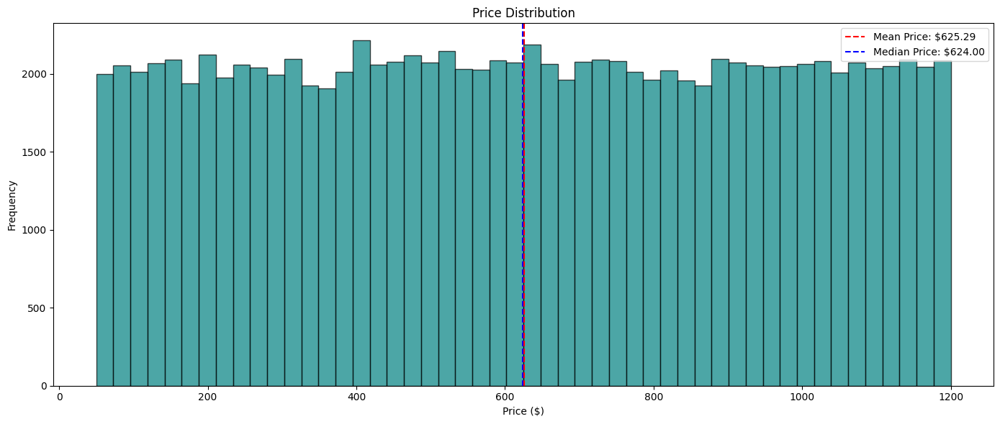

In [22]:
# Price Distribution
airbnb_df["price"] = pd.to_numeric(airbnb_df["price"].astype(str).str.replace("[$,]", '', regex = True), errors = "coerce")

plt.figure(figsize = (14, 6))
plt.hist(airbnb_df["price"].dropna(), bins = 50, alpha = 0.7, color = "teal", edgecolor = "black")
plt.title("Price Distribution")
plt.xlabel("Price ($)")
plt.ylabel("Frequency")

# Add summary statistics as text
mean_price = airbnb_df["price"].mean()
median_price = airbnb_df["price"].median()
plt.axvline(mean_price, color = "red", linestyle = "--", label = f"Mean Price: ${mean_price:.2f}")
plt.axvline(median_price, color = "blue", linestyle = "--", label = f"Median Price: ${median_price:.2f}")
plt.legend()

plt.tight_layout()
plt.show()

In [23]:
airbnb_df["service fee"].isna().sum()

np.int64(273)

In [24]:
airbnb_df["service fee"].dtype

dtype('O')

In [25]:
airbnb_df["service fee"].head(5)

0    $193 
1     $28 
2    $124 
3     $74 
4     $41 
Name: service fee, dtype: object

In [26]:
airbnb_df["service fee"].describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95])

count     102326
unique       231
top         $41 
freq         526
Name: service fee, dtype: object

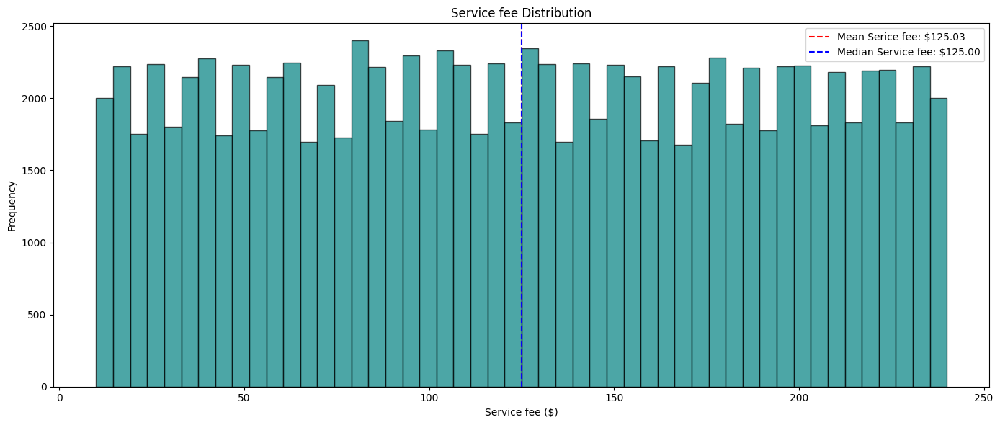

In [27]:
airbnb_df["service fee"] = pd.to_numeric(airbnb_df["service fee"].astype(str).str.replace("[$,]", '', regex = True), errors = "coerce")

plt.figure(figsize = (14, 6))
plt.hist(airbnb_df["service fee"].dropna(), bins = 50, alpha = 0.7, color = "teal", edgecolor = "black")
plt.title("Service fee Distribution")
plt.xlabel("Service fee ($)")
plt.ylabel("Frequency")

# Add summary statistics as text
mean_fee = airbnb_df["service fee"].mean()
median_fee = airbnb_df["service fee"].median()
plt.axvline(mean_fee, color = "red", linestyle = "--", label = f"Mean Serice fee: ${mean_fee:.2f}")
plt.axvline(median_fee, color = "blue", linestyle = "--", label = f"Median Service fee: ${median_fee:.2f}")
plt.legend()

plt.tight_layout()
plt.show()

In [31]:
fig = px.scatter(
    airbnb_df,
    y = "service fee",
    x = "price",
    title = "Price vs Service fee",
    labels = {"service fee": "Service fee", "price": "Price"},
    opacity = 0.5
)
fig.update_layout(yaxis_type = "log")
fig.show()

In [28]:
airbnb_df["minimum nights"].isna().sum()

np.int64(409)

In [29]:
airbnb_df["minimum nights"].dtype

dtype('float64')

In [58]:
airbnb_df["minimum nights"].min(), airbnb_df["minimum nights"].max()

(np.float64(-1223.0), np.float64(5645.0))

In [59]:
airbnb_df[(airbnb_df["minimum nights"] > 0) & (airbnb_df["minimum nights"] < 365)].shape

(102088, 26)

In [92]:
airbnb_df["minimum nights"].describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95])

count    102190.000000
mean          8.135845
std          30.553781
min       -1223.000000
25%           2.000000
50%           3.000000
75%           5.000000
90%          30.000000
95%          30.000000
max        5645.000000
Name: minimum nights, dtype: float64

In [94]:
airbnb_df[(airbnb_df["minimum nights"] <= 0)].shape[0]

13

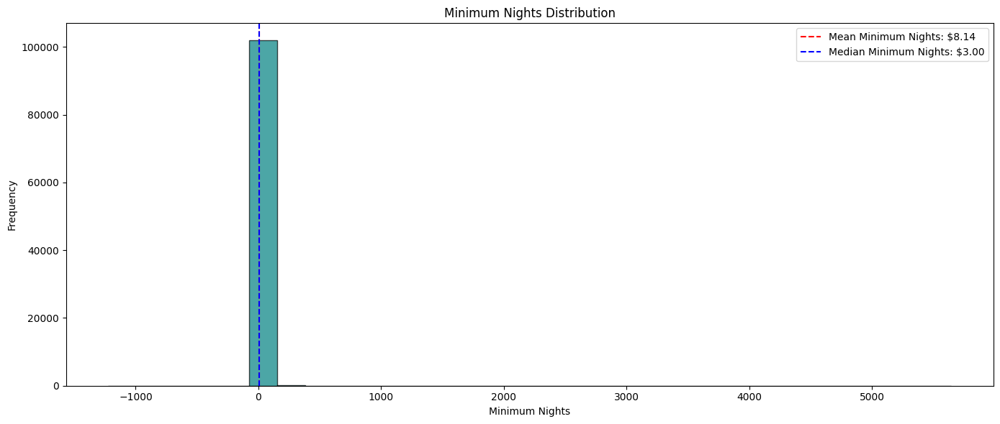

In [60]:
plt.figure(figsize = (14, 6))
plt.hist(airbnb_df["minimum nights"].dropna(), bins = 30, alpha = 0.7, color = "teal", edgecolor = "black")
plt.title("Minimum Nights Distribution")
plt.xlabel("Minimum Nights")
plt.ylabel("Frequency")

# Add summary statistics as text
mean_nights = airbnb_df["minimum nights"].mean()
median_nights = airbnb_df["minimum nights"].median()
plt.axvline(mean_nights, color = "red", linestyle = "--", label = f"Mean Minimum Nights: ${mean_nights:.2f}")
plt.axvline(mean_nights, color = "blue", linestyle = "--", label = f"Median Minimum Nights: ${median_nights:.2f}")
plt.legend()

plt.tight_layout()
plt.show()

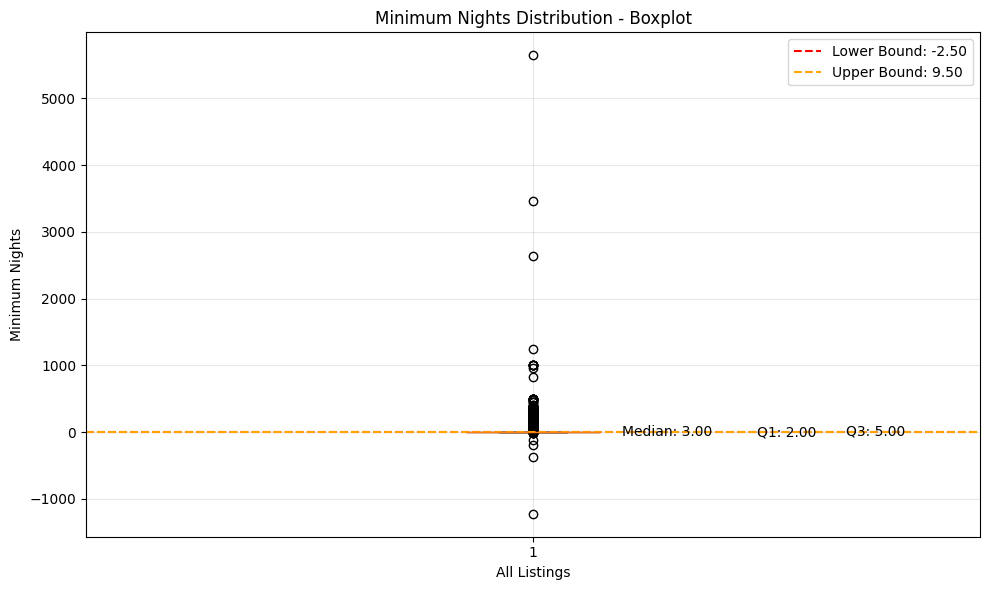

In [61]:
plt.figure(figsize=(10, 6))
box_plot = plt.boxplot(airbnb_df["minimum nights"].dropna(), patch_artist=True)
box_plot["boxes"][0].set_facecolor("lightblue")

plt.title("Minimum Nights Distribution - Boxplot")
plt.ylabel("Minimum Nights")
plt.xlabel("All Listings")
plt.grid(True, alpha=0.3)

# IQR calculation
median_nights = airbnb_df["minimum nights"].median()
q1 = airbnb_df["minimum nights"].quantile(0.25)
q3 = airbnb_df["minimum nights"].quantile(0.75)
iqr_val = q3 - q1

lower_threshold = q1 - 1.5 * iqr_val
upper_threshold = q3 + 1.5 * iqr_val

plt.axhline(y = lower_threshold, color='red', linestyle='--', label=f'Lower Bound: {lower_threshold:.2f}')
plt.axhline(y = upper_threshold, color='orange', linestyle='--', label=f'Upper Bound: {upper_threshold:.2f}')

plt.text(1.1, median_nights, f"Median: {median_nights:.2f}", va = "center")
plt.text(1.25, q1, f"Q1: {q1:.2f}", va = "center")
plt.text(1.35, q3, f"Q3: {q3:.2f}", va = "center")

plt.legend()
plt.tight_layout()
plt.show()

In [62]:
airbnb_df["number of reviews"].isna().sum()

np.int64(183)

In [63]:
airbnb_df["number of reviews"].dtype

dtype('float64')

In [64]:
airbnb_df["number of reviews"].min(), airbnb_df["number of reviews"].max()

(np.float64(0.0), np.float64(1024.0))

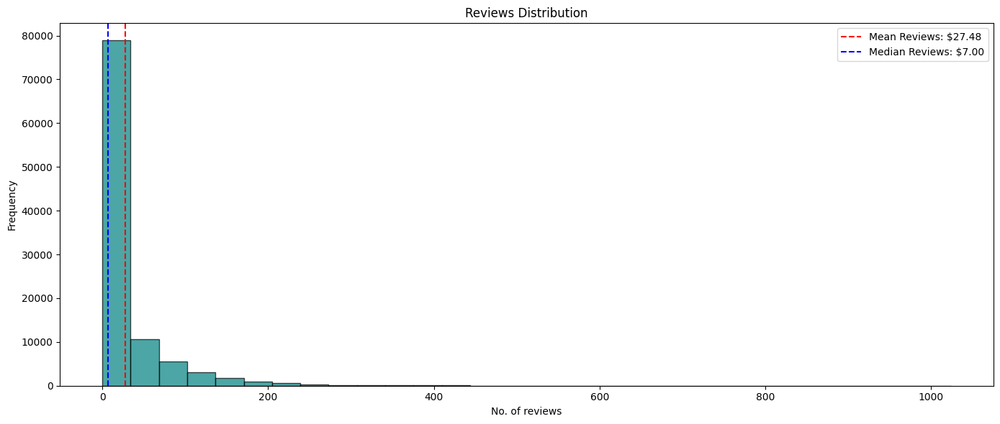

In [65]:
plt.figure(figsize = (14, 6))
plt.hist(airbnb_df["number of reviews"].dropna(), bins = 30, alpha = 0.7, color = "teal", edgecolor = "black")
plt.title("Reviews Distribution")
plt.xlabel("No. of reviews")
plt.ylabel("Frequency")

# Add summary statistics as text
mean_reviews = airbnb_df["number of reviews"].mean()
median_reviews = airbnb_df["number of reviews"].median()
plt.axvline(mean_reviews, color = "red", linestyle = "--", label = f"Mean Reviews: ${mean_reviews:.2f}")
plt.axvline(median_reviews, color = "blue", linestyle = "--", label = f"Median Reviews: ${median_reviews:.2f}")
plt.legend()

plt.tight_layout()
plt.show()

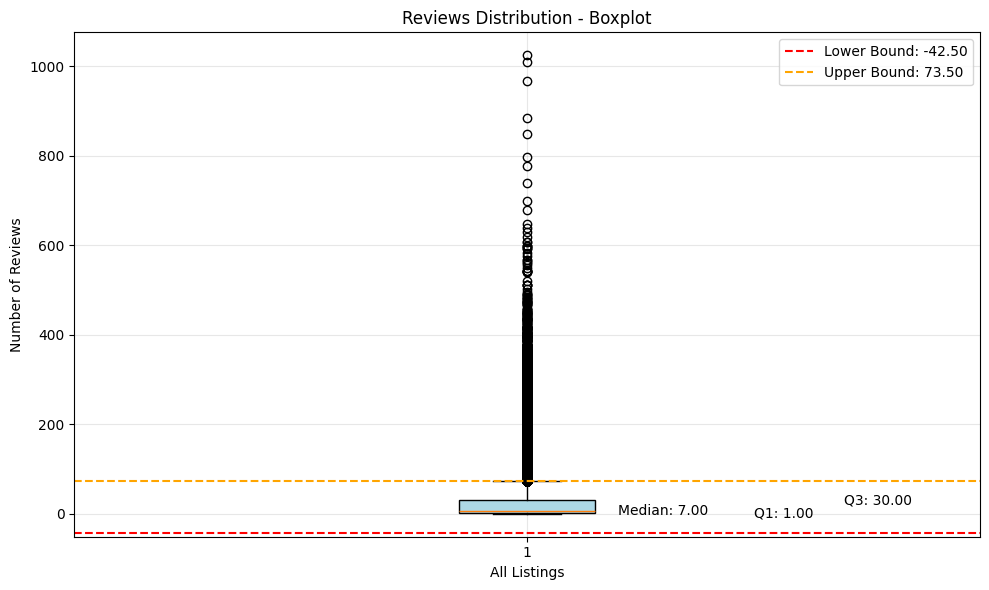

In [66]:
plt.figure(figsize=(10, 6))
box_plot = plt.boxplot(airbnb_df["number of reviews"].dropna(), patch_artist=True)
box_plot["boxes"][0].set_facecolor("lightblue")

plt.title("Reviews Distribution - Boxplot")
plt.ylabel("Number of Reviews")
plt.xlabel("All Listings")
plt.grid(True, alpha=0.3)

# IQR calculation
median_reviews = airbnb_df["number of reviews"].median()
q1 = airbnb_df["number of reviews"].quantile(0.25)
q3 = airbnb_df["number of reviews"].quantile(0.75)
iqr_val = q3 - q1

lower_threshold = q1 - 1.5 * iqr_val
upper_threshold = q3 + 1.5 * iqr_val

plt.axhline(y = lower_threshold, color='red', linestyle='--', label=f'Lower Bound: {lower_threshold:.2f}')
plt.axhline(y = upper_threshold, color='orange', linestyle='--', label=f'Upper Bound: {upper_threshold:.2f}')

plt.text(1.1, median_reviews, f"Median: {median_reviews:.2f}", va = "center")
plt.text(1.25, q1, f"Q1: {q1:.2f}", va = "center")
plt.text(1.35, q3, f"Q3: {q3:.2f}", va = "center")

plt.legend()
plt.tight_layout()
plt.show()

In [67]:
airbnb_df[(airbnb_df["number of reviews"] > -40) & (airbnb_df["number of reviews"] < 75)].shape

(90870, 26)

In [68]:
airbnb_df[(airbnb_df["number of reviews"] > 1000)]

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
52488,29990458,Sonder Battery Park | Studio Apartment,53558555483,verified,Sonder (NYC),Manhattan,Financial District,40.70617,-74.01486,United States,...,24.0,2.0,1024.0,2/21/2022,57.31,4.0,54.0,365.0,NaN,NaN
62244,35378697,City King,44069230937,verified,Arlo SoHo,Manhattan,SoHo,40.72440,-74.00794,United States,...,219.0,1.0,1010.0,11/22/2021,33.08,4.0,11.0,80.0,NaN,NaN


In [69]:
airbnb_df["last review"].isna().sum()

np.int64(15893)

In [70]:
airbnb_df["last review"].dtype

dtype('O')

In [71]:
airbnb_df["last review"].head(5)

0    10/19/2021
1     5/21/2022
2           NaN
3      7/5/2019
4    11/19/2018
Name: last review, dtype: object

In [72]:
airbnb_df["reviews per month"].isna().sum()

np.int64(15879)

In [73]:
airbnb_df["reviews per month"].dtype

dtype('float64')

In [74]:
airbnb_df["reviews per month"].head(5)

0    0.21
1    0.38
2     NaN
3    4.64
4    0.10
Name: reviews per month, dtype: float64

In [75]:
airbnb_df["reviews per month"].min(), airbnb_df["reviews per month"].max()

(np.float64(0.01), np.float64(90.0))

In [32]:
fig = px.histogram(
    airbnb_df,
    x = "reviews per month",
    title = "Reviews per month",
    labels = {"reviews per month": "Monthly Review"},
    range_x = [0, 10]
)
fig.show()

In [98]:
airbnb_df["reviews per month"].describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95])

count    86720.000000
mean         1.374022
std          1.746621
min          0.010000
25%          0.220000
50%          0.740000
75%          2.000000
90%          3.540000
95%          4.550000
max         90.000000
Name: reviews per month, dtype: float64

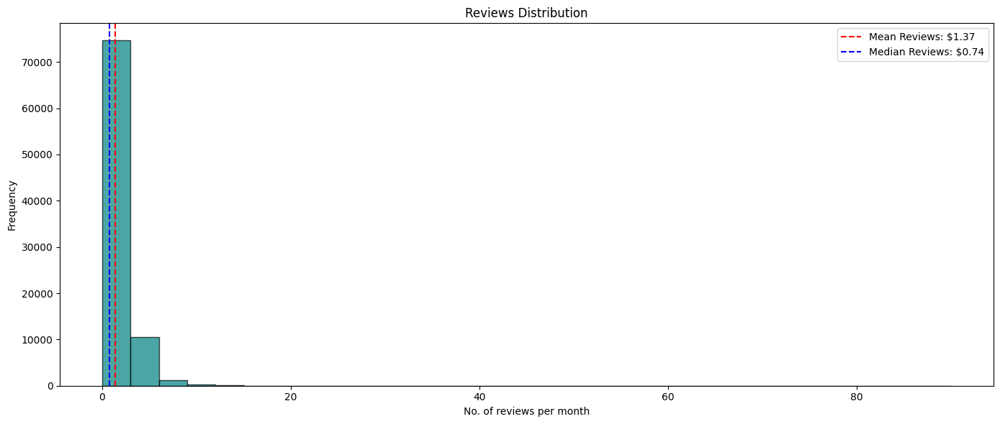

In [76]:
plt.figure(figsize = (14, 6))
plt.hist(airbnb_df["reviews per month"].dropna(), bins = 30, alpha = 0.7, color = "teal", edgecolor = "black")
plt.title("Reviews Distribution")
plt.xlabel("No. of reviews per month")
plt.ylabel("Frequency")

# Add summary statistics as text
mean_reviews_per_month = airbnb_df["reviews per month"].mean()
median_reviews_per_month = airbnb_df["reviews per month"].median()
plt.axvline(mean_reviews_per_month, color = "red", linestyle = "--", label = f"Mean Reviews: ${mean_reviews_per_month:.2f}")
plt.axvline(median_reviews_per_month, color = "blue", linestyle = "--", label = f"Median Reviews: ${median_reviews_per_month:.2f}")
plt.legend()

plt.tight_layout()
plt.show()

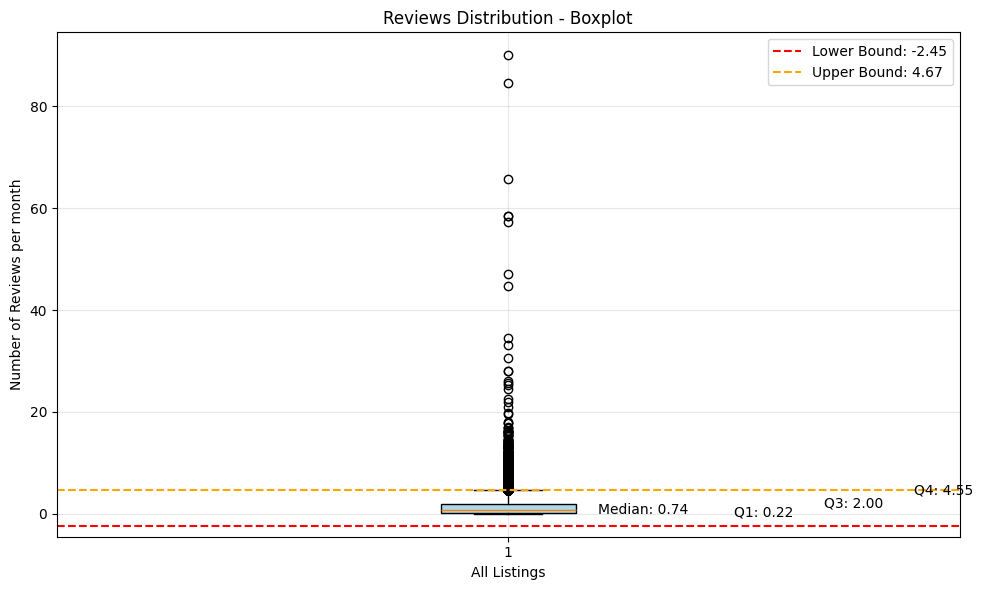

In [77]:
plt.figure(figsize=(10, 6))
box_plot = plt.boxplot(airbnb_df["reviews per month"].dropna(), patch_artist=True)
box_plot["boxes"][0].set_facecolor("lightblue")

plt.title("Reviews Distribution - Boxplot")
plt.ylabel("Number of Reviews per month")
plt.xlabel("All Listings")
plt.grid(True, alpha=0.3)

# IQR calculation
median_reviews_per_month = airbnb_df["reviews per month"].median()
q1 = airbnb_df["reviews per month"].quantile(0.25)
q3 = airbnb_df["reviews per month"].quantile(0.75)
q4 = airbnb_df["reviews per month"].quantile(0.95)
iqr_val = q3 - q1

lower_threshold = q1 - 1.5 * iqr_val
upper_threshold = q3 + 1.5 * iqr_val

plt.axhline(y = lower_threshold, color='red', linestyle='--', label=f'Lower Bound: {lower_threshold:.2f}')
plt.axhline(y = upper_threshold, color='orange', linestyle='--', label=f'Upper Bound: {upper_threshold:.2f}')

plt.text(1.1, median_reviews_per_month, f"Median: {median_reviews_per_month:.2f}", va = "center")
plt.text(1.25, q1, f"Q1: {q1:.2f}", va = "center")
plt.text(1.35, q3, f"Q3: {q3:.2f}", va = "center")
plt.text(1.45, q4, f"Q4: {q4:.2f}", va = "center")

plt.legend()
plt.tight_layout()
plt.show()

In [78]:
airbnb_df["review rate number"].isna().sum()

np.int64(326)

In [79]:
airbnb_df["review rate number"].dtype

dtype('float64')

In [80]:
airbnb_df["review rate number"].head(5)

0    4.0
1    4.0
2    5.0
3    4.0
4    3.0
Name: review rate number, dtype: float64

In [81]:
airbnb_df["review rate number"].min(), airbnb_df["review rate number"].max()

(np.float64(1.0), np.float64(5.0))

In [82]:
airbnb_df["review rate number"].head(5)

0    4.0
1    4.0
2    5.0
3    4.0
4    3.0
Name: review rate number, dtype: float64

In [27]:
review_rate = airbnb_df["review rate number"].value_counts().reset_index(name = "count")
fig = px.bar(
    review_rate,
    x = "review rate number",
    y = "count",
    color = "review rate number",
    title = "Rating Distribution",
    labels = {"review rate number": "Review", "count": "Frequency"}
)
fig.show()

In [83]:
airbnb_df["calculated host listings count"].dtype

dtype('float64')

In [84]:
airbnb_df["calculated host listings count"].head(5)

0    6.0
1    2.0
2    1.0
3    1.0
4    1.0
Name: calculated host listings count, dtype: float64

In [24]:
fig = px.histogram(
    airbnb_df,
    x = ["calculated host listings count"],
    title = "Calculated Host Listing Distribution",
    labels = {"value": "Calculated host listings"},
    range_x = [0, 20]
)
fig.show()

In [97]:
airbnb_df["calculated host listings count"].describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95])

count    102280.000000
mean          7.936605
std          32.218780
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
90%           7.000000
95%          29.000000
max         332.000000
Name: calculated host listings count, dtype: float64

In [85]:
airbnb_df["calculated host listings count"].min(), airbnb_df["calculated host listings count"].max()

(np.float64(1.0), np.float64(332.0))

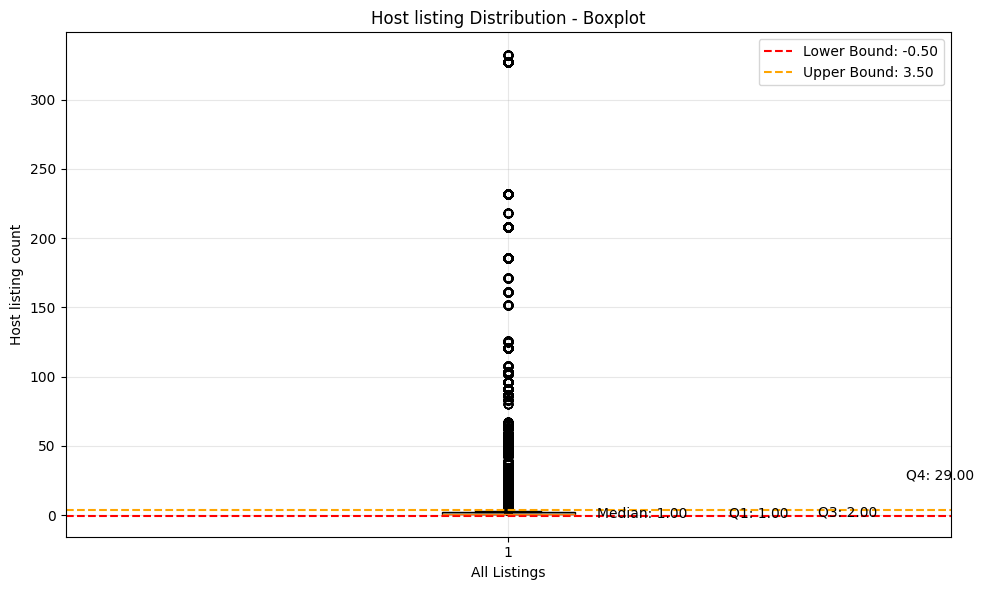

In [86]:
plt.figure(figsize=(10, 6))
box_plot = plt.boxplot(airbnb_df["calculated host listings count"].dropna(), patch_artist=True)
box_plot["boxes"][0].set_facecolor("lightblue")

plt.title("Host listing Distribution - Boxplot")
plt.ylabel("Host listing count")
plt.xlabel("All Listings")
plt.grid(True, alpha=0.3)

# IQR calculation
median_host_listing = airbnb_df["calculated host listings count"].median()
q1 = airbnb_df["calculated host listings count"].quantile(0.25)
q3 = airbnb_df["calculated host listings count"].quantile(0.75)
q4 = airbnb_df["calculated host listings count"].quantile(0.95)
iqr_val = q3 - q1

lower_threshold = q1 - 1.5 * iqr_val
upper_threshold = q3 + 1.5 * iqr_val

plt.axhline(y = lower_threshold, color='red', linestyle='--', label=f'Lower Bound: {lower_threshold:.2f}')
plt.axhline(y = upper_threshold, color='orange', linestyle='--', label=f'Upper Bound: {upper_threshold:.2f}')

plt.text(1.1, median_host_listing, f"Median: {median_host_listing:.2f}", va = "center")
plt.text(1.25, q1, f"Q1: {q1:.2f}", va = "center")
plt.text(1.35, q3, f"Q3: {q3:.2f}", va = "center")
plt.text(1.45, q4, f"Q4: {q4:.2f}", va = "center")

plt.legend()
plt.tight_layout()
plt.show()

In [87]:
airbnb_df["availability 365"].isna().sum()

np.int64(448)

In [88]:
airbnb_df["availability 365"].nunique()

438

In [89]:
airbnb_df["availability 365"].dtype

dtype('float64')

In [ ]:
airbnb_df["availability 365"].min(), airbnb_df["availability 365"].max()

(np.float64(-10.0), np.float64(3677.0))

In [96]:
airbnb_df["availability 365"].describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95])

count    102151.000000
mean        141.133254
std         135.435024
min         -10.000000
25%           3.000000
50%          96.000000
75%         269.000000
90%         350.000000
95%         365.000000
max        3677.000000
Name: availability 365, dtype: float64

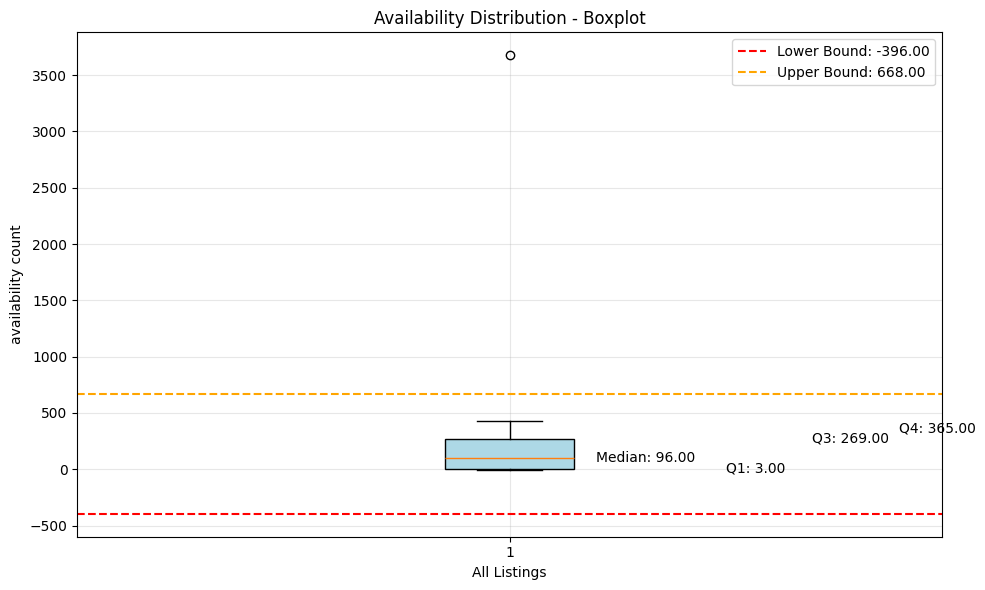

In [91]:
plt.figure(figsize=(10, 6))
box_plot = plt.boxplot(airbnb_df["availability 365"].dropna(), patch_artist=True)
box_plot["boxes"][0].set_facecolor("lightblue")

plt.title("Availability Distribution - Boxplot")
plt.ylabel("availability count")
plt.xlabel("All Listings")
plt.grid(True, alpha=0.3)

# IQR calculation
median_availability = airbnb_df["availability 365"].median()
q1 = airbnb_df["availability 365"].quantile(0.25)
q3 = airbnb_df["availability 365"].quantile(0.75)
q4 = airbnb_df["availability 365"].quantile(0.95)
iqr_val = q3 - q1

lower_threshold = q1 - 1.5 * iqr_val
upper_threshold = q3 + 1.5 * iqr_val

plt.axhline(y = lower_threshold, color='red', linestyle='--', label=f'Lower Bound: {lower_threshold:.2f}')
plt.axhline(y = upper_threshold, color='orange', linestyle='--', label=f'Upper Bound: {upper_threshold:.2f}')

plt.text(1.1, median_availability, f"Median: {median_availability:.2f}", va = "center")
plt.text(1.25, q1, f"Q1: {q1:.2f}", va = "center")
plt.text(1.35, q3, f"Q3: {q3:.2f}", va = "center")
plt.text(1.45, q4, f"Q4: {q4:.2f}", va = "center")

plt.legend()
plt.tight_layout()
plt.show()

In [486]:
airbnb_df["house_rules"].isna().sum()

np.int64(52131)

In [487]:
airbnb_df["house_rules"].dtype

dtype('O')

In [488]:
airbnb_df["house_rules"].head(5)

0    Clean up and treat the home the way you'd like...
1    Pet friendly but please confirm with me if the...
2    I encourage you to use my kitchen, cooking and...
3                                                  NaN
4    Please no smoking in the house, porch or on th...
Name: house_rules, dtype: object

In [489]:
airbnb_df["license"].isna().sum()

np.int64(102597)

In [490]:
airbnb_df["license"].dtype

dtype('O')

In [495]:
airbnb_df["calculated host listings count"].isna().sum()

np.int64(319)

In [496]:
airbnb_df["calculated host listings count"].dtype

dtype('float64')

In [497]:
airbnb_df["calculated host listings count"].min(), airbnb_df["calculated host listings count"].max()

(np.float64(1.0), np.float64(332.0))

In [498]:
airbnb_df["calculated host listings count"].head(5)

0    6.0
1    2.0
2    1.0
3    1.0
4    1.0
Name: calculated host listings count, dtype: float64